## Notebook Overview
- Load the combined dataset and derive the binary admission target.
- Scale numeric vitals, one-hot encode categorical features, and split train/test sets.
- Benchmark structured-feature classifiers (Naive Bayes, kNN, Logistic Regression, XGBoost).
- Build TF-IDF representations for chief complaints and train text-only baselines.
- Combine text and numeric inputs in an MLP, fit the network, and visualize training history.


In [ ]:
from helper_functions.nn import create_nn
from helper_functions.notebook_utils import plot_distribution, plot_history
from helper_functions.testing import encode_and_split


In [3]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

In [4]:
merged_df = pd.read_csv('combined_data.csv')
merged_df.drop(columns=['Unnamed: 0'], inplace=True)

Now based on exploration of the dataframe, we will include TRANSFER and ADMITTED as counting as admission, and all others such as HOME, ELOPED, OTHER to be not admitted. 

# Numerical & Categorical Data Model

In [3]:
merged_df

,subject_id,stay_id,hadm_id,intime,outtime,time_of_day,temperature,heartrate,resprate,o2sat,sbp,dbp,acuity,gender,race,arrival_transport,chiefcomplaint,disposition
0,10000032,32952584,29079034.0,2180-07-22 16:24:00,2180-07-23 05:54:00,16.40,97.8,87.0,14.0,97.0,71.0,43.0,2.0,F,WHITE,AMBULANCE,Hypotension,HOME
1,10000032,33258284,22595853.0,2180-05-06 19:17:00,2180-05-06 23:30:00,19.28,98.4,70.0,16.0,97.0,106.0,63.0,3.0,F,WHITE,AMBULANCE,"Abd pain, Abdominal distention",ADMITTED
2,10000032,35968195,25742920.0,2180-08-05 20:58:00,2180-08-06 01:44:00,20.97,99.4,105.0,18.0,96.0,106.0,57.0,3.0,F,WHITE,AMBULANCE,"n/v/d, Abd pain",ADMITTED
3,10000032,38112554,22841357.0,2180-06-26 15:54:00,2180-06-26 21:31:00,15.90,98.9,88.0,18.0,97.0,116.0,88.0,3.0,F,WHITE,AMBULANCE,Abdominal distention,ADMITTED
4,10000032,39399961,29079034.0,2180-07-23 05:54:00,2180-07-23 14:00:00,5.90,98.7,77.0,16.0,98.0,96.0,50.0,2.0,F,WHITE,AMBULANCE,"Abdominal distention, Abd pain, LETHAGIC",ADMITTED
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
376206,19999784,34149746,25715748.0,2119-08-11 09:15:00,2119-08-11 13:40:00,9.25,98.8,92.0,18.0,100.0,122.0,77.0,3.0,M,BLACK,WALK IN,Wound eval,ADMITTED
376207,19999784,35692999,26194817.0,2119-06-18 14:21:00,2119-06-18 21:09:29,14.35,98.6,80.0,18.0,100.0,161.0,100.0,3.0,M,BLACK,WALK IN,L Leg weakness,ADMITTED
376208,19999784,37972930,24935234.0,2119-07-09 17:38:00,2119-07-10 00:04:00,17.63,98.0,91.0,16.0,99.0,148.0,90.0,2.0,M,BLACK,WALK IN,Abnormal MRI,ADMITTED
376209,19999828,30712109,29734428.0,2147-07-17 17:18:00,2147-07-18 17:34:00,17.30,98.1,83.0,18.0,100.0,107.0,75.0,2.0,F,WHITE,WALK IN,"Abd pain, Wound eval",ADMITTED


In [4]:
frequent_races = ['WHITE', 'BLACK', 'HISPANIC', 'ASIAN']

# Update 'disposition' column
conditions = (merged_df['disposition'] == 'ADMITTED') | (merged_df['disposition'] == 'TRANSFER')
merged_df.loc[conditions, 'disposition'] = 'A'
merged_df.loc[~conditions, 'disposition'] = 'NA'

# Update 'race' column
merged_df.loc[~merged_df['race'].isin(frequent_races), 'race'] = 'OTHER'

In [5]:
columns = merged_df.columns
for column in columns[6:13]:
    print(column)
    column_data = merged_df[column]
    print(f'- Min: {column_data.min()}')
    print(f'- Median: {round(column_data.median(), 3)}')
    print(f'- Max: {column_data.max()}')

temperature
- Min: 96.0
- Median: 98.0
- Max: 104.0
heartrate
- Min: 20.0
- Median: 84.0
- Max: 250.0
resprate
- Min: 6.0
- Median: 18.0
- Max: 80.0
o2sat
- Min: 70.0
- Median: 99.0
- Max: 100.0
sbp
- Min: 50.0
- Median: 133.0
- Max: 250.0
dbp
- Min: 30.0
- Median: 77.0
- Max: 150.0
acuity
- Min: 1.0
- Median: 3.0
- Max: 5.0


In [6]:
columns = merged_df.columns
for column in columns[5:13]:
    scaler = MinMaxScaler()
    values = merged_df[column].values.reshape(-1, 1)
    merged_df[column] = scaler.fit_transform(values)


In [278]:
columns[5:13]

Index(['time_of_day', 'temperature', 'heartrate', 'resprate', 'o2sat', 'sbp',
       'dbp', 'acuity'],
      dtype='object')

In [279]:
merged_df

,subject_id,stay_id,hadm_id,intime,outtime,time_of_day,temperature,heartrate,resprate,o2sat,sbp,dbp,acuity,gender,race,arrival_transport,chiefcomplaint,disposition
0,10000032,32952584,29079034.0,2180-07-22 16:24:00,2180-07-23 05:54:00,0.683903,0.2250,0.291304,0.108108,0.900000,0.105,0.108333,0.25,F,WHITE,AMBULANCE,Hypotension,NA
1,10000032,33258284,22595853.0,2180-05-06 19:17:00,2180-05-06 23:30:00,0.804003,0.3000,0.217391,0.135135,0.900000,0.280,0.275000,0.50,F,WHITE,AMBULANCE,"Abd pain, Abdominal distention",A
2,10000032,35968195,25742920.0,2180-08-05 20:58:00,2180-08-06 01:44:00,0.874479,0.4250,0.369565,0.162162,0.866667,0.280,0.225000,0.50,F,WHITE,AMBULANCE,"n/v/d, Abd pain",A
3,10000032,38112554,22841357.0,2180-06-26 15:54:00,2180-06-26 21:31:00,0.663053,0.3625,0.295652,0.162162,0.900000,0.330,0.483333,0.50,F,WHITE,AMBULANCE,Abdominal distention,A
4,10000032,39399961,29079034.0,2180-07-23 05:54:00,2180-07-23 14:00:00,0.246038,0.3375,0.247826,0.135135,0.933333,0.230,0.166667,0.25,F,WHITE,AMBULANCE,"Abdominal distention, Abd pain, LETHAGIC",A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
376206,19999784,34149746,25715748.0,2119-08-11 09:15:00,2119-08-11 13:40:00,0.385738,0.3500,0.313043,0.162162,1.000000,0.360,0.391667,0.50,M,BLACK,WALK IN,Wound eval,A
376207,19999784,35692999,26194817.0,2119-06-18 14:21:00,2119-06-18 21:09:29,0.598415,0.3250,0.260870,0.162162,1.000000,0.555,0.583333,0.50,M,BLACK,WALK IN,L Leg weakness,A
376208,19999784,37972930,24935234.0,2119-07-09 17:38:00,2119-07-10 00:04:00,0.735196,0.2500,0.308696,0.135135,0.966667,0.490,0.500000,0.25,M,BLACK,WALK IN,Abnormal MRI,A
376209,19999828,30712109,29734428.0,2147-07-17 17:18:00,2147-07-18 17:34:00,0.721435,0.2625,0.273913,0.162162,1.000000,0.285,0.375000,0.25,F,WHITE,WALK IN,"Abd pain, Wound eval",A


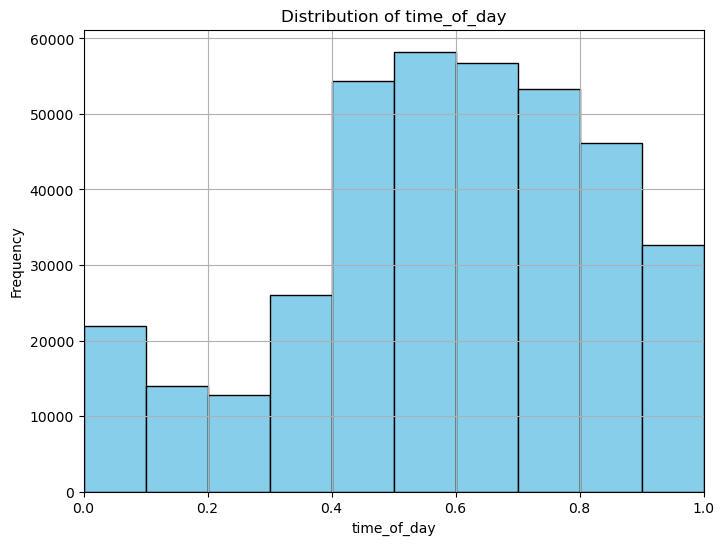

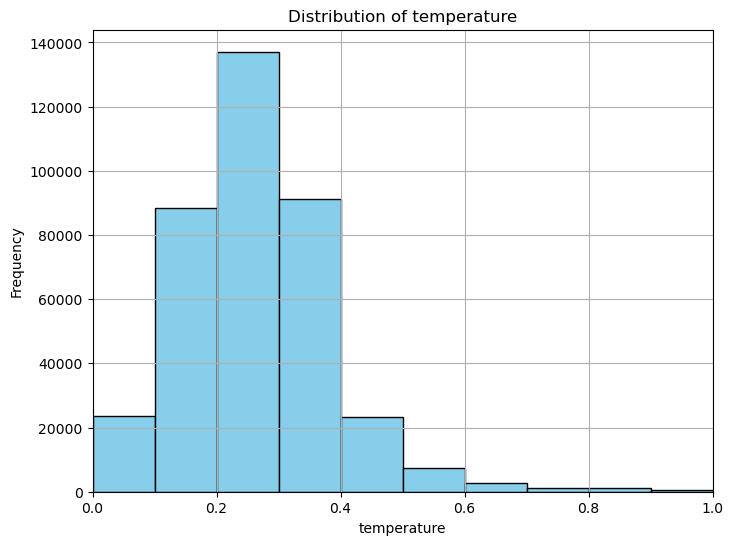

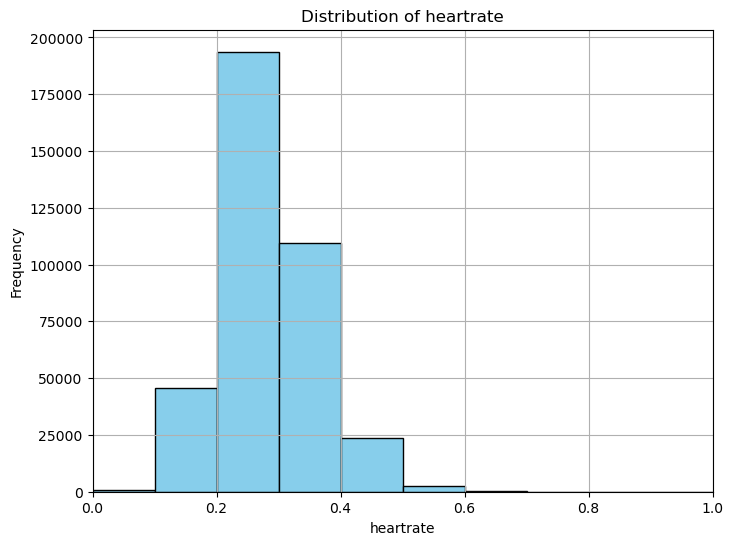

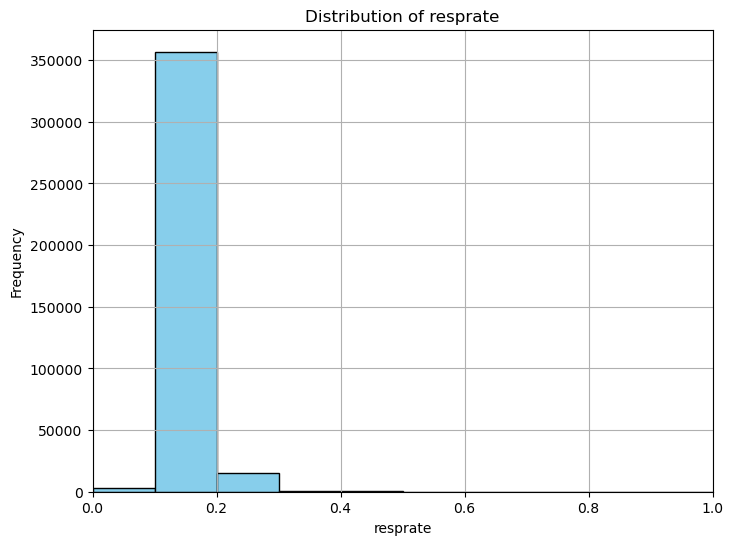

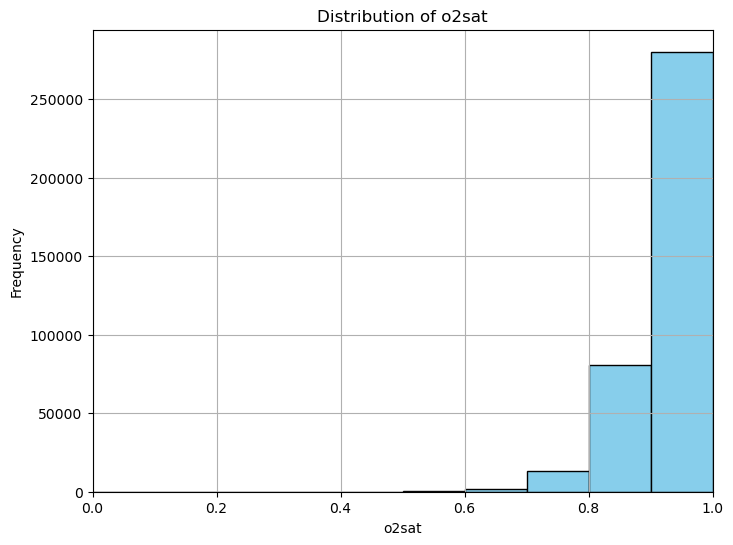

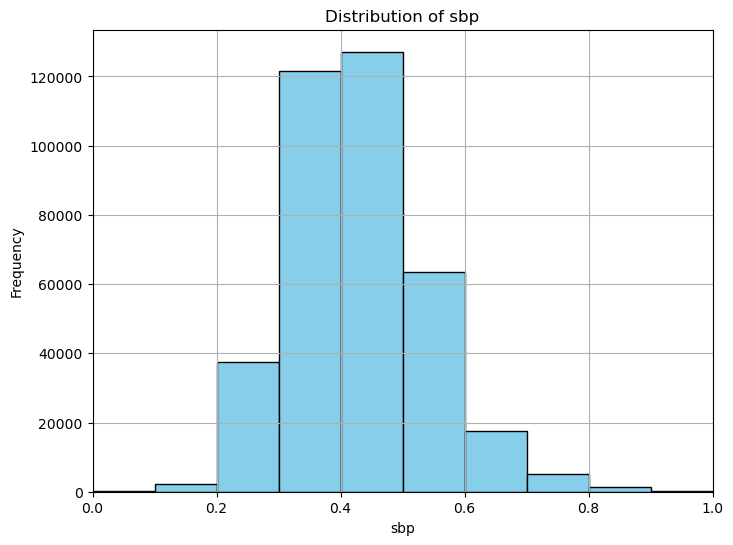

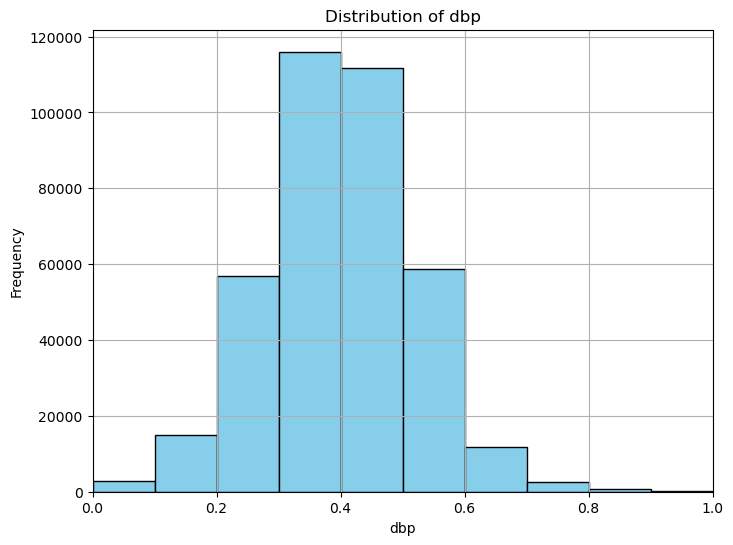

In [8]:
for column in columns[5:12]:
    pct = plot_distribution(merged_df, column)

In [9]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

In [10]:
copy = merged_df.copy()

categorical_columns = ['gender', 'race', 'arrival_transport']
numeric_values = copy[columns[5:13]].values
categorical_values = copy[categorical_columns]

encoder = OneHotEncoder()

# Check the number of categories in each column
num_categories = categorical_values.nunique()
print("Number of categories in each column:")
print(num_categories)

# Fit the OneHotEncoder with the categorical values
encoder.fit(categorical_values)

categorical_values = encoder.transform(categorical_values).toarray()
# To get the inverse we can do encoder.inverse_transform(categorical_values)

Number of categories in each column:
gender               2
race                 5
arrival_transport    2
dtype: int64


Now let's create our datasets:

In [11]:
X_num_cat = np.concatenate((numeric_values, categorical_values), axis=1)

disposition_column = merged_df['disposition'].values

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit LabelEncoder and transform the 'disposition' column
Y_encoded = label_encoder.fit_transform(disposition_column)
Y = (1 - Y_encoded)

In [12]:
merged_df

,subject_id,stay_id,hadm_id,intime,outtime,time_of_day,temperature,heartrate,resprate,o2sat,sbp,dbp,acuity,gender,race,arrival_transport,chiefcomplaint,disposition
0,10000032,32952584,29079034.0,2180-07-22 16:24:00,2180-07-23 05:54:00,0.683903,0.2250,0.291304,0.108108,0.900000,0.105,0.108333,0.25,F,WHITE,AMBULANCE,Hypotension,NA
1,10000032,33258284,22595853.0,2180-05-06 19:17:00,2180-05-06 23:30:00,0.804003,0.3000,0.217391,0.135135,0.900000,0.280,0.275000,0.50,F,WHITE,AMBULANCE,"Abd pain, Abdominal distention",A
2,10000032,35968195,25742920.0,2180-08-05 20:58:00,2180-08-06 01:44:00,0.874479,0.4250,0.369565,0.162162,0.866667,0.280,0.225000,0.50,F,WHITE,AMBULANCE,"n/v/d, Abd pain",A
3,10000032,38112554,22841357.0,2180-06-26 15:54:00,2180-06-26 21:31:00,0.663053,0.3625,0.295652,0.162162,0.900000,0.330,0.483333,0.50,F,WHITE,AMBULANCE,Abdominal distention,A
4,10000032,39399961,29079034.0,2180-07-23 05:54:00,2180-07-23 14:00:00,0.246038,0.3375,0.247826,0.135135,0.933333,0.230,0.166667,0.25,F,WHITE,AMBULANCE,"Abdominal distention, Abd pain, LETHAGIC",A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
376206,19999784,34149746,25715748.0,2119-08-11 09:15:00,2119-08-11 13:40:00,0.385738,0.3500,0.313043,0.162162,1.000000,0.360,0.391667,0.50,M,BLACK,WALK IN,Wound eval,A
376207,19999784,35692999,26194817.0,2119-06-18 14:21:00,2119-06-18 21:09:29,0.598415,0.3250,0.260870,0.162162,1.000000,0.555,0.583333,0.50,M,BLACK,WALK IN,L Leg weakness,A
376208,19999784,37972930,24935234.0,2119-07-09 17:38:00,2119-07-10 00:04:00,0.735196,0.2500,0.308696,0.135135,0.966667,0.490,0.500000,0.25,M,BLACK,WALK IN,Abnormal MRI,A
376209,19999828,30712109,29734428.0,2147-07-17 17:18:00,2147-07-18 17:34:00,0.721435,0.2625,0.273913,0.162162,1.000000,0.285,0.375000,0.25,F,WHITE,WALK IN,"Abd pain, Wound eval",A


In [13]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

In [14]:
X_train, X_test, Y_train, Y_test = train_test_split(X_num_cat, Y, test_size=0.2, random_state=42)

In [15]:
def sensitivity_and_specificity(confusion_matrix):
    tp = confusion_matrix[1, 1]
    fn = confusion_matrix[1, 0]
    tn = confusion_matrix[0, 0]
    fp = confusion_matrix[0, 1]
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    return sensitivity, specificity

def acc(confusion_matrix):
    tp = confusion_matrix[1, 1]
    fn = confusion_matrix[1, 0]
    tn = confusion_matrix[0, 0]
    fp = confusion_matrix[0, 1]
    accuracy = (tp+tn)/(tp+tn+fp+fn)
    return accuracy
    

Naive Bayes Model:
Accuracy: 66.95%
Confusion Matrix:
[[39738  7306]
 [17559 10640]]
Sensitivity: 0.377
Specificity: 0.845


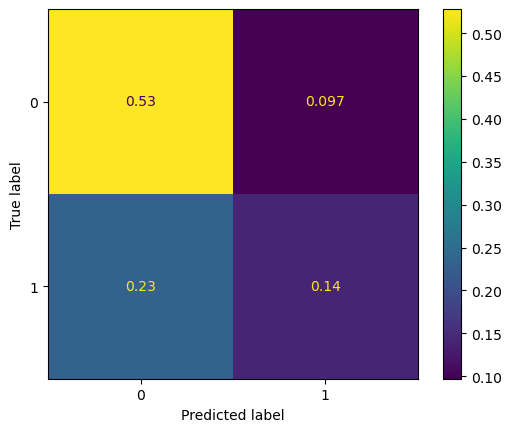

In [16]:
# Train Naive Bayes model
nb_model = MultinomialNB()
nb_model.fit(X_train, Y_train)
nb_predictions = nb_model.predict(X_test)
nb_accuracy = accuracy_score(Y_test, nb_predictions)
nb_confusion_matrix = confusion_matrix(Y_test, nb_predictions)
ConfusionMatrixDisplay.from_estimator(nb_model, X_test, Y_test, normalize='all')


print("Naive Bayes Model:")
print(f"Accuracy: {round(nb_accuracy*100, 2)}%")
print("Confusion Matrix:")
print(nb_confusion_matrix)
sensitivity, specificity = sensitivity_and_specificity(nb_confusion_matrix)
print(f'Sensitivity: {round(sensitivity, 3)}')
print(f'Specificity: {round(specificity, 3)}')


kNN Model:
Accuracy: 68.12%
Confusion Matrix:
[[37429  9615]
 [14370 13829]]
Sensitivity: 0.49
Specificity: 0.796


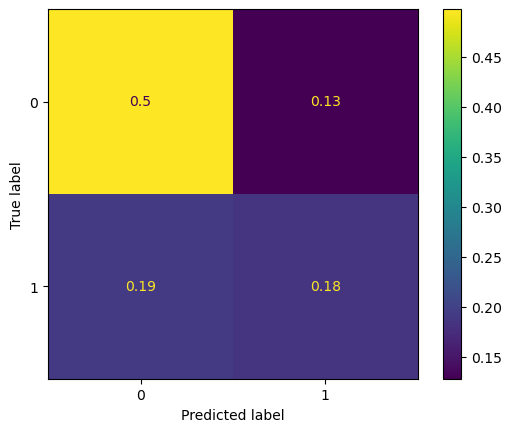

In [17]:
# Train kNN model
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, Y_train)
knn_predictions = knn_model.predict(X_test)
knn_accuracy = accuracy_score(Y_test, knn_predictions)
knn_confusion_matrix = confusion_matrix(Y_test, knn_predictions)

ConfusionMatrixDisplay.from_estimator(knn_model, X_test, Y_test, normalize='all')


print("\nkNN Model:")
print(f"Accuracy: {round(knn_accuracy*100, 2)}%")
print("Confusion Matrix:")
print(knn_confusion_matrix)
knn_sensitivity, knn_specificity = sensitivity_and_specificity(knn_confusion_matrix)
print(f'Sensitivity: {round(knn_sensitivity, 3)}')
print(f'Specificity: {round(knn_specificity, 3)}')


Logistic Regression Model:
Accuracy: 71.31%
Confusion Matrix:
[[40019  7025]
 [14564 13635]]
Sensitivity: 0.484
Specificity: 0.851


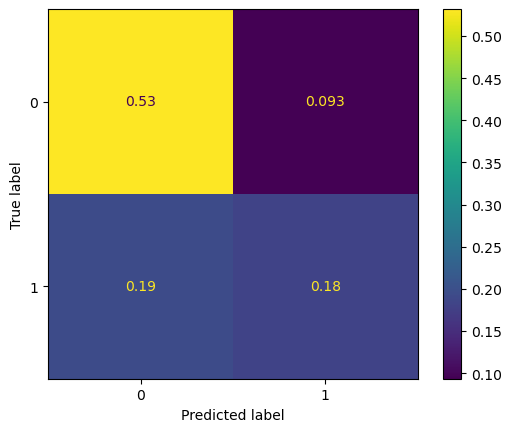

In [18]:
# Train Logistic Regression model with increased max_iter
logistic_model = LogisticRegression(max_iter=1000)
logistic_model.fit(X_train, Y_train)
logistic_predictions = logistic_model.predict(X_test)
logistic_accuracy = accuracy_score(Y_test, logistic_predictions)
logistic_confusion_matrix = confusion_matrix(Y_test, logistic_predictions)

ConfusionMatrixDisplay.from_estimator(logistic_model, X_test, Y_test, normalize='all')

print("\nLogistic Regression Model:")
print(f"Accuracy: {round(logistic_accuracy*100, 2)}%")
print("Confusion Matrix:")
print(logistic_confusion_matrix)
logistic_sensitivity, logistic_specificity = sensitivity_and_specificity(logistic_confusion_matrix)
print(f'Sensitivity: {round(logistic_sensitivity, 3)}')
print(f'Specificity: {round(logistic_specificity, 3)}')

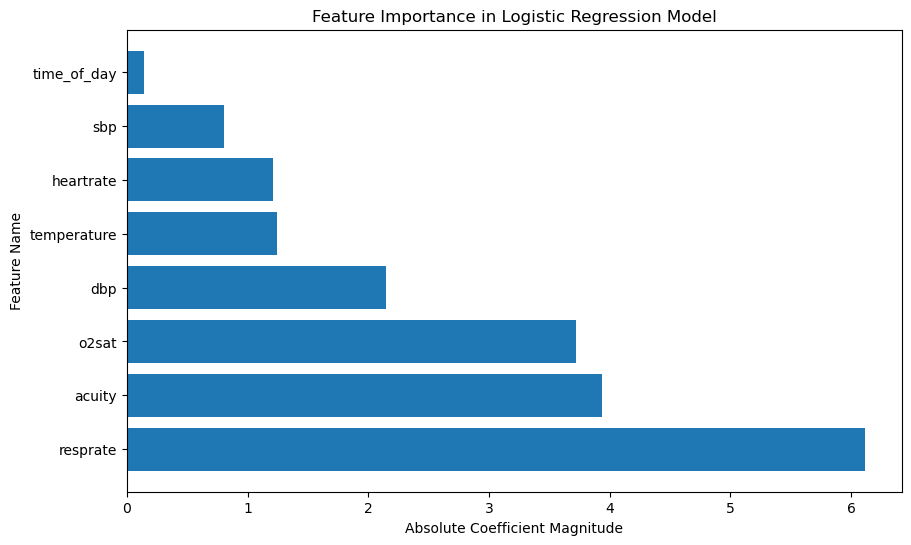

In [19]:
coefficients = logistic_model.coef_[0]

feature_names = columns[5:13]
feature_names = feature_names[:8]  # Considering only the first 8 features

# Sort the coefficients and feature names based on importance
sorted_indices = np.argsort(np.abs(coefficients[:8]))[::-1]
sorted_features = [feature_names[i] for i in sorted_indices]
sorted_coefficients = coefficients[sorted_indices]

# Plot the feature importance
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_features)), np.abs(sorted_coefficients), align='center')
plt.yticks(range(len(sorted_features)), sorted_features)
plt.xlabel('Absolute Coefficient Magnitude')
plt.ylabel('Feature Name')
plt.title('Feature Importance in Logistic Regression Model')
plt.show()


XGBoost Model:
Accuracy: 71.75%
Confusion Matrix:
[[39944  7100]
 [14153 14046]]
Sensitivity: 0.498
Specificity: 0.849


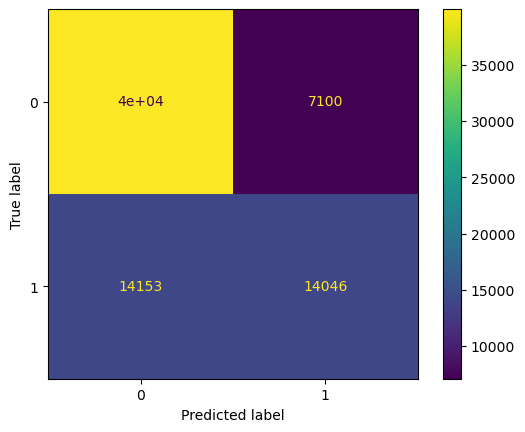

In [20]:
import xgboost as xgb

# Define XGBoost parameters
params = {
    'max_depth': 3,
    'learning_rate': 0.1,
    'objective': 'binary:logistic',
    'eval_metric': 'logloss'
}

# Create DMatrix for XGBoost
dtrain = xgb.DMatrix(X_train, label=Y_train)

# Train the XGBoost model
num_rounds = 100
xgb_model = xgb.train(params, dtrain, num_rounds)

# Predictions
dtest = xgb.DMatrix(X_test)
xgb_predictions = xgb_model.predict(dtest)
xgb_predictions_binary = [1 if pred > 0.5 else 0 for pred in xgb_predictions]

# Accuracy and Confusion Matrix
xgb_accuracy = accuracy_score(Y_test, xgb_predictions_binary)
xgb_confusion_matrix = confusion_matrix(Y_test, xgb_predictions_binary)

# Display Confusion Matrix
ConfusionMatrixDisplay.from_predictions(Y_test, xgb_predictions_binary)
# ConfusionMatrixDisplay.from_estimator(logistic_model, X_test, Y_test, normalize='all')


print("\nXGBoost Model:")
print(f"Accuracy: {round(xgb_accuracy*100, 2)}%")
print("Confusion Matrix:")
print(xgb_confusion_matrix)
xgb_sensitivity, xgb_specificity = sensitivity_and_specificity(xgb_confusion_matrix)
print(f'Sensitivity: {round(xgb_sensitivity, 3)}')
print(f'Specificity: {round(xgb_specificity, 3)}')

# Bag of Words Implementation

In [21]:
from sklearn.feature_extraction.text import TfidfVectorizer
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import Pipeline
import matplotlib
import random

In [22]:
text = merged_df['chiefcomplaint'].values

X_train, X_test, Y_train, Y_test = train_test_split(text, Y, test_size=0.2, random_state=42)

vectorizer = TfidfVectorizer(min_df=10)
X_train_tfidf = vectorizer.fit_transform(X_train)  # Fit the vectorizer and transform the training set

X_test_tfidf = vectorizer.transform(X_test)  # Transform the testing set

print("Data Shape:", X_test_tfidf.shape, '\n')

ind = random.randint(0, X_test.shape[0])

vectorized_row = X_test_tfidf[ind]

# Convert the vectorized form back to text using the inverse transformation of the vectorizer
reconstructed_text = vectorizer.inverse_transform(vectorized_row)

# Get the original text from the test set
original_text = X_test[ind]

# Convert the reconstructed text from a list of tokens to a string
reconstructed_text_str = ' '.join(reconstructed_text[0])

# Compare the original text with the reconstructed text
print(f'Index Number {ind}')
print("Original Text:", original_text)
print("Vectorized Row:", vectorized_row)
print("Reconstructed Text:", reconstructed_text_str)

Data Shape: (75243, 1074) 

Index Number 12825
Original Text: Syncope
Vectorized Row:   (0, 943)	1.0
Reconstructed Text: syncope



Naive Bayes Model:
Accuracy: 72.99%
Confusion Matrix:
[[41744  5300]
 [15022 13177]]
Sensitivity: 0.467
Specificity: 0.887


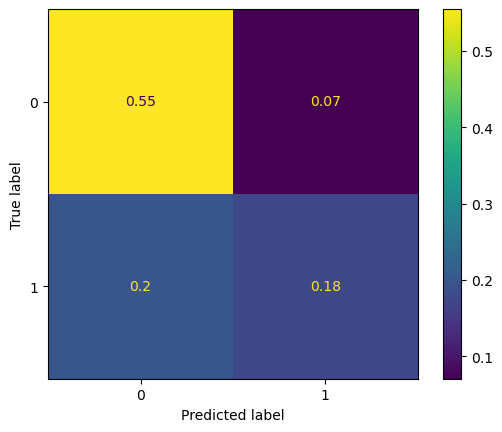

In [23]:
clf = MultinomialNB()
clf.fit(X_train_tfidf, Y_train)
predictions = clf.predict(X_test_tfidf)

accuracy = accuracy_score(Y_test, predictions)
conf_matrix = confusion_matrix(Y_test, predictions)

ConfusionMatrixDisplay.from_estimator(clf, X_test_tfidf, Y_test, normalize='all')

print("\nNaive Bayes Model:")
print(f"Accuracy: {round(accuracy*100, 2)}%")
print("Confusion Matrix:")
print(conf_matrix)
sensitivity, specificity = sensitivity_and_specificity(conf_matrix)
print(f'Sensitivity: {round(sensitivity, 3)}')
print(f'Specificity: {round(specificity, 3)}')


Logistic Regression Model:
Accuracy: 73.25%
Confusion Matrix:
[[40980  6064]
 [14060 14139]]
Sensitivity: 0.501
Specificity: 0.871


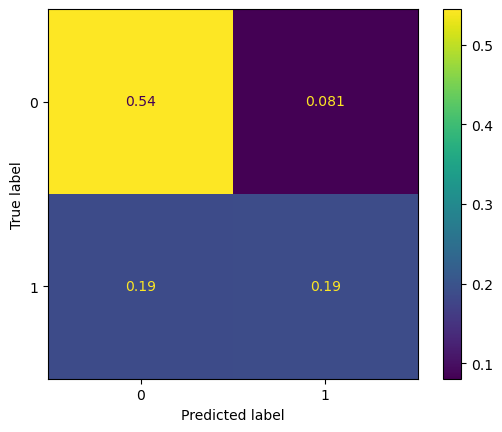

In [24]:
clf = LogisticRegression(max_iter=1000)
clf.fit(X_train_tfidf, Y_train)
predictions = clf.predict(X_test_tfidf)

accuracy = accuracy_score(Y_test, predictions)
conf_matrix = confusion_matrix(Y_test, predictions)

ConfusionMatrixDisplay.from_estimator(clf, X_test_tfidf, Y_test, normalize='all')

print("\nLogistic Regression Model:")
print(f"Accuracy: {round(accuracy*100, 2)}%")
print("Confusion Matrix:")
print(conf_matrix)
sensitivity, specificity = sensitivity_and_specificity(conf_matrix)
print(f'Sensitivity: {round(sensitivity, 3)}')
print(f'Specificity: {round(specificity, 3)}')

In [25]:
classifier = MultinomialNB()
# classifier = LogisticRegression(max_iter=1000)

pipeline = Pipeline([
    ('vecorizer', TfidfVectorizer(min_df=10)),
    ('clf', classifier)
])
pipeline.fit(X_train, Y_train)

Pipeline(steps=[('vecorizer', TfidfVectorizer(min_df=10)),
                ('clf', MultinomialNB())])

In [26]:
class_names = ['Not Admitted', 'Admitted']

random_array = np.random.randint(0, X_test.shape[0]-1, size=10)

for index in random_array:
    print(f'Test Set Index {index}')
    sample = X_test[index]
    print(' - Complaint:',sample)
    print(' - Probability Admitted =', round(pipeline.predict_proba([sample])[0,1], 3))
    print(' - Probability Not Admitted =', round(pipeline.predict_proba([sample])[0,0], 3))
    label = 'Admitted' if Y_train[index] == 1 else 'Not Admitted'
    print(' - True Label:', label, '\n')

Test Set Index 69437
 - Complaint: ETOH
 - Probability Admitted = 0.089
 - Probability Not Admitted = 0.911
 - True Label: Not Admitted 

Test Set Index 9083
 - Complaint: RLQ PAIN
 - Probability Admitted = 0.28
 - Probability Not Admitted = 0.72
 - True Label: Not Admitted 

Test Set Index 72239
 - Complaint: Altered mental status
 - Probability Admitted = 0.908
 - Probability Not Admitted = 0.092
 - True Label: Not Admitted 

Test Set Index 64067
 - Complaint: Abd pain, Transfer
 - Probability Admitted = 0.72
 - Probability Not Admitted = 0.28
 - True Label: Not Admitted 

Test Set Index 16842
 - Complaint: ABD PAIN
 - Probability Admitted = 0.428
 - Probability Not Admitted = 0.572
 - True Label: Admitted 

Test Set Index 5015
 - Complaint: LOWER EXTREMITY PAIN
 - Probability Admitted = 0.151
 - Probability Not Admitted = 0.849
 - True Label: Not Admitted 

Test Set Index 17244
 - Complaint: Hyperkalemia, Abnormal labs
 - Probability Admitted = 0.843
 - Probability Not Admitted = 0.

In [27]:
class_names = ['Not Admitted', 'Admitted']

matplotlib.rcParams['figure.dpi']=300

for index in random_array:
    
    label = 'Admitted' if Y_train[index] == 1 else 'Not Admitted'
    print('\n - True Label:', label)
    
    sample = X_test[index]
    explainer = LimeTextExplainer(class_names=class_names)
    explanation = explainer.explain_instance(sample, 
                                            pipeline.predict_proba)
    
    explanation.show_in_notebook(text=True)
    


 - True Label: Not Admitted



 - True Label: Not Admitted



 - True Label: Not Admitted



 - True Label: Not Admitted



 - True Label: Admitted



 - True Label: Not Admitted



 - True Label: Not Admitted



 - True Label: Admitted



 - True Label: Admitted



 - True Label: Admitted


# Combining Both Models

In [28]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.models import Model
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier

In [29]:
def sensitivity(y_true, y_pred):
    true_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true * y_pred, 0, 1)))
    possible_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true, 0, 1)))
    return true_positives / (possible_positives + tf.keras.backend.epsilon())

def specificity(y_true, y_pred):
    true_negatives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip((1 - y_true) * (1 - y_pred), 0, 1)))
    possible_negatives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(1 - y_true, 0, 1)))
    return true_negatives / (possible_negatives + tf.keras.backend.epsilon())

In [30]:
# Combining text data with numerical data for training and testing
string_array_reshaped = text.reshape(-1, 1)
X_combined = np.concatenate((X_num_cat, string_array_reshaped), axis=1)

X_train3, X_test3, Y_train3, Y_test3 = train_test_split(X_combined, Y, test_size=0.2, random_state=42)

In [32]:
X_train3_num, X_test3_num, X_train3_encoded, X_test3_encoded = encode_and_split(X_train3, X_test3)

In [ ]:
# Print model summarymodel = create_nn([64, 32], [32])model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 encoded_text_input (InputLayer  [(None, 1074)]      0           []                               
 )                                                                                                
                                                                                                  
 dense (Dense)                  (None, 64)           68800       ['encoded_text_input[0][0]']     
                                                                                                  
 numeric_input (InputLayer)     [(None, 17)]         0           []                               
                                                                                                  
 dense_1 (Dense)                (None, 32)           2080        ['dense[0][0]']              

In [34]:
# Train the model
history = model.fit(
    [X_train3_num, X_train3_encoded],  # Input features
    Y_train3,                          # Target variable
    epochs=5,                         # Number of epochs
    batch_size=32,                     # Batch size
    validation_split=0.2,              # Fraction of training data to be used as validation set
)

Epoch 1/5


2024-04-10 16:00:48.513385: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


7525/7525 [==============================] - 11s 1ms/step - loss: 0.4925 - accuracy: 0.7554 - sensitivity: 0.5858 - specificity: 0.8559 - val_loss: 0.4814 - val_accuracy: 0.7610 - val_sensitivity: 0.6542 - val_specificity: 0.8235
Epoch 2/5
7525/7525 [==============================] - 9s 1ms/step - loss: 0.4770 - accuracy: 0.7646 - sensitivity: 0.6104 - specificity: 0.8557 - val_loss: 0.4775 - val_accuracy: 0.7647 - val_sensitivity: 0.5646 - val_specificity: 0.8825
Epoch 3/5
7525/7525 [==============================] - 10s 1ms/step - loss: 0.4724 - accuracy: 0.7676 - sensitivity: 0.6173 - specificity: 0.8567 - val_loss: 0.4749 - val_accuracy: 0.7650 - val_sensitivity: 0.5866 - val_specificity: 0.8700
Epoch 4/5
7525/7525 [==============================] - 10s 1ms/step - loss: 0.4691 - accuracy: 0.7693 - sensitivity: 0.6198 - specificity: 0.8578 - val_loss: 0.4755 - val_accuracy: 0.7658 - val_sensitivity: 0.5742 - val_specificity: 0.8782
Epoch 5/5
7525/7525 [==============================

2352/2352 [==============================] - 1s 517us/step

Combined Model:
Accuracy: 76.67%
Sensitivity: 0.587
Specificity: 0.875


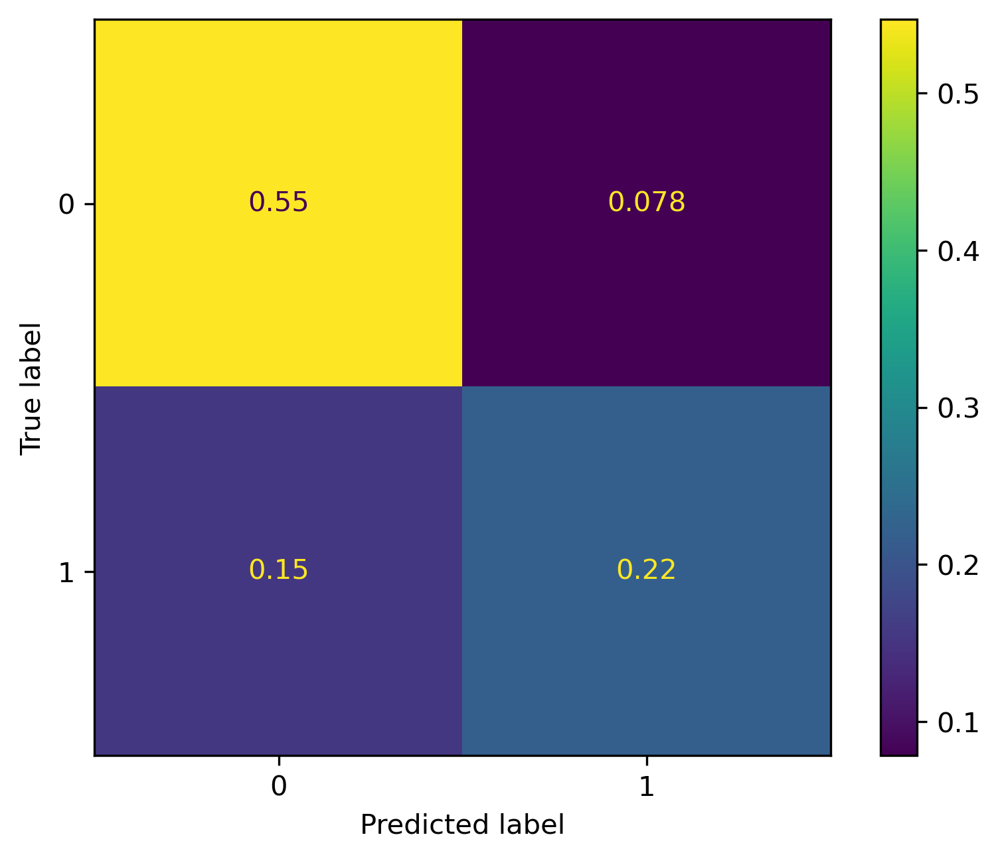

In [35]:
# Predict the classes using the trained model
y_pred = model.predict([X_test3_num, X_test3_encoded])
y_pred_classes = (y_pred > 0.5).astype(int)

# Get the confusion matrix
cm = confusion_matrix(Y_test3, y_pred_classes, normalize='all')  # Normalizing by all values

# Define class names (if applicable)
class_names = ['0', '1']  # Modify this according to your classes


# Display the confusion matrix with relative frequencies
accuracy = acc(cm)
print("\nCombined Model:")
print(f"Accuracy: {round(accuracy*100, 2)}%")
sensitivity, specificity = sensitivity_and_specificity(cm)
print(f'Sensitivity: {round(sensitivity, 3)}')
print(f'Specificity: {round(specificity, 3)}')
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot()
plt.show()

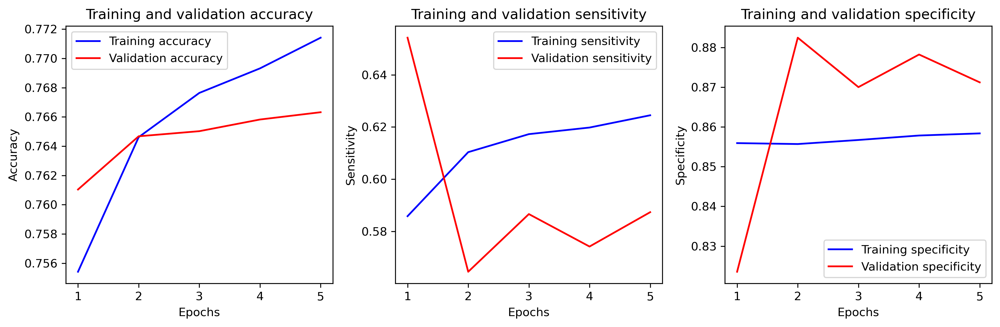

In [37]:
plot_history(history)